# Linear Regression
> From the first principles

- toc: true 
- badges: true
- comments: true
- image: images/linear_regr.png
- categories: [machine learning]


In the current post, we will try to understand simple linear regression algorithm
and its algorithm writing from scratch 
and same thing we compare that comes from sci-kit learn <br>
And some of the statistical terminologies to understand the model. 
For this, we'll use Boston Housing Data set, this is a sample dataset from sklearn

#### Import required Python libraries

In [1]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML


In [2]:
# Load the data set
from sklearn.datasets import load_boston

In [3]:
boston_data = load_boston()

In [4]:
type(boston_data)

sklearn.utils.Bunch

boston_data is a dictionary, like a regular Python dictionary we can access
its keys and values

In [5]:
boston_data.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR'])

To check the features

In [6]:
boston_data['feature_names']

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'],
      dtype='<U7')

To check the size of data

In [7]:
boston_data['data'].shape

(506, 13)

And there is description about the data

In [8]:
print(boston_data['DESCR'])

Boston House Prices dataset

Notes
------
Data Set Characteristics:  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive
    
    :Median Value (attribute 14) is usually the target

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
      

We will create Pandas DataFrame with data from Boson dataset

In [9]:
df = pd.DataFrame(data=boston_data['data'])

df.columns = boston_data['feature_names']


We' ll add target data to this DataFrame

In [10]:
df['Price'] =  boston_data['target']

In [11]:
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


We'll first try Simple Linear Regression with single independent variable

If we check the correlation of all other features with Target, 


In [12]:
corr = df.corr()

In [13]:
corr['Price'].sort_values(ascending=False)

Price      1.000000
RM         0.695360
ZN         0.360445
B          0.333461
DIS        0.249929
CHAS       0.175260
AGE       -0.376955
RAD       -0.381626
CRIM      -0.385832
NOX       -0.427321
TAX       -0.468536
INDUS     -0.483725
PTRATIO   -0.507787
LSTAT     -0.737663
Name: Price, dtype: float64

From description RM is number of rooms per dwelling. 
This feature is more correlated with housing price. 

We can also qualitatively see the correlation map 

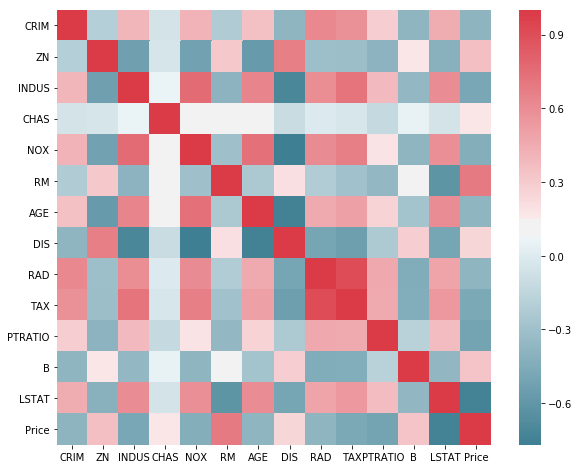

In [14]:
import seaborn as sns

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

The bottom most row show the correlation  the square 

In [15]:
from pylab import rcParams
rcParams['figure.figsize'] = 20, 15

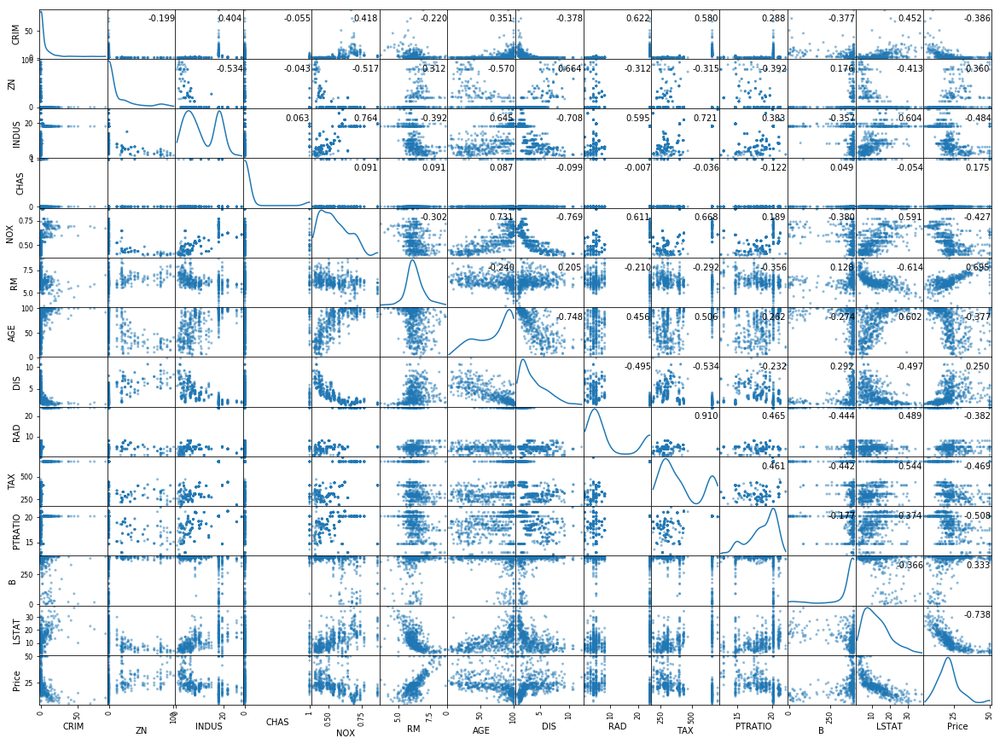

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
axes = scatter_matrix(df, alpha=0.5, diagonal='kde')
corr = df.corr().as_matrix()
for i, j in zip(*plt.np.triu_indices_from(axes, k=1)):
    axes[i, j].annotate("%.3f" %corr[i,j], (0.8, 0.8), xycoords='axes fraction', ha='center', va='center')
plt.show()

From the last column we can see only the RM feature has good linear relation with housing price <br>
So, for this Simple Linear Regression we'll just consider RM and Price features

In [17]:
x = df['RM']
y = df['Price']

In [18]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 8

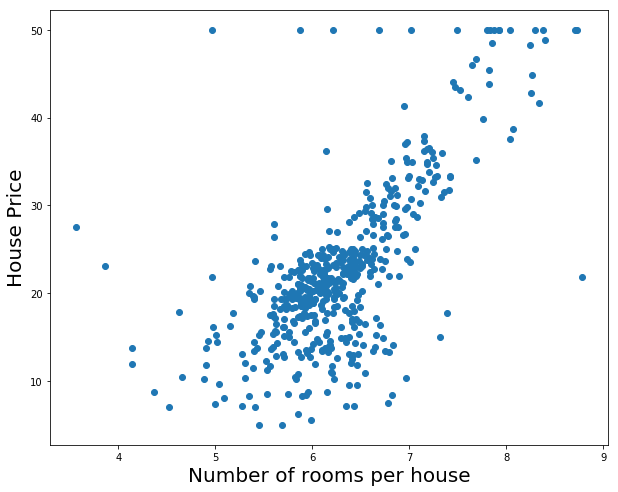

In [19]:
plt.scatter(x,y)
plt.xlabel('Number of rooms per house', size = 20)
plt.ylabel('House Price', size = 20)
plt.show()

We need to do feature scaling for linear gradient, for better convergence

In [20]:
x = (x - x.mean())/x.std()
y = (y - y.mean())/y.std()

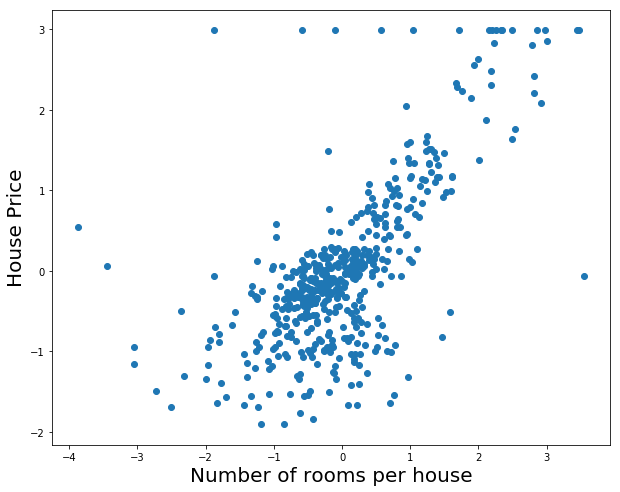

In [21]:
plt.scatter(x,y)
plt.xlabel('Number of rooms per house', size = 20)
plt.ylabel('House Price', size = 20)
plt.show()

# Simple Linear Regression

This is called simple linear regression model since it involves only one regressor variable (RM) <br>
And we want to model the data using a linear plot 

\begin{equation}
y = \theta_0 + \theta_1 x 
\end{equation}


Here x is the independent variable (or predictor or regressor)  'RM' and y is the dependent variable(or response) 'House Price' 

We use Stochastic Gradient Descent (or Batch Gradient Descent) to find these coefficients 

## Gradient Descent 

This is an optimization technique to find the minimum or maximum of a function by iterating through a sequence of steps. <br>
Gradient Descent algorithms also called steepest descent algorithms

Parameters $\theta_0$ and $\theta_1$ are the regression coefficients 
Slope $\theta_1$ is the change in the mean of the distribution of y produced by a unit change in x


\begin{equation}
y^i = \theta_0 + \theta_1 x^i, \quad \quad i = 1,2,3...m  
\end{equation}


We need to find a fitted line for this. <br>
Say, the simple linear regression model is 

\begin{equation}
\widehat{y^i} = \widehat{\theta_0} + \widehat{\theta_1} x^i
\end{equation}

where least square estimators of $\theta_0$ and $\theta_1$ are $\widehat{\theta_0}$ and $\widehat{\theta_1} $


Linear regression models the relation between the regressor and response with a linear surface called hyperplane.
This hyperplane has one dimension less than the dimension of the dataset.
For simple linear regression, we are dealing with two dimensions, x and y. 
So, hyperplane here will be 1D - line 

 $\widehat{y}$ linearly depends on only two parameters $\theta_0$ and $\theta_1$, so it lies within a one dimensional subspace of the 2-dimensional space in which $y$ points lies. <br>
So, predictions of a linear regression are always on a straight line. 


![Image of Cost_function](https://drive.google.com/uc?id=1iuhWWswGq2KLMFS2fDEw_M-pMrQcSPHG)


The difference between the observed value $y^i$ and the corresponding fitted value $\widehat{y^i}$ is a residual

$i^{th} $ residual is
\begin{equation}
e^i = y^i - \widehat{y^i}, \quad i = 1,2,...m
\end{equation}

\begin{equation}
e^i = y^i - (\widehat{\theta_0} + \widehat{\theta_1} x^i)
\end{equation}

So the predicted value
\begin{equation}
 \widehat{y^i} = \widehat{\theta_0} + \widehat{\theta_1} x^i   
\end{equation}

i.e. say for first point $x^1$ correponding predicted y point is $\widehat{y_1}$
$$ \widehat{y_1} = \widehat{\theta_0} + \widehat{\theta_1} x^1 $$
Similarly 
$$ \widehat{y_2} = \widehat{\theta_0} + \widehat{\theta_1} x^2  $$
$$ . $$
$$ . $$
$$ . $$
$$ \widehat{y_m} =\widehat{\theta_0} + \widehat{\theta_1} x^m $$

\begin{equation}
 \widehat{y^1} + \widehat{y^2} + ... \widehat{y^m} = m \times \widehat{\theta_0} + \widehat{\theta_1} \times (x^1 + x^2 +... x^m) 
\end{equation}

We want find the estimators $\widehat{\theta_0}$ and $\widehat{\theta_1}$ such that above LHS and RHS  are equal

From equation 21 and 32 we can write <br>
Total error
$$ \epsilon =  m \times \widehat{\theta_0} + \widehat{\theta_1} \times (x^1 + x^2 +... x^m) - y^1 + y^2 + .... y^m $$

We can rewrite this as 
$$ \epsilon = h_{\theta}(x^i) - y^i $$


where $h_{\theta}(x^i)$ is called hypothesis function. <br>
Since, here we are using a linear function as hypothesis function, even if the actual data exhibits some non-linearity,
the mathematical model we form will be a linear one, and the nonlinearlity in the data will be treated as noise or residue. 

In fact, in linear regression model, we assume the errors have mean zero and unknown variance

Mean square error is 
$$ \dfrac{1}{m} \sum\limits_{i=1}^m [h_{\theta}(x^i) - y^i]^2  $$

In Gradient descent we are using method of least squares  to estimate these parameters, so the sum of the squares of the differences between the observations y and the straight line is minimum

Mean of squared error
or Cost function 
\begin{equation}
J(\theta_0,\theta_1) = \dfrac{1}{2m} \sum\limits_{i=1}^m [h_{\theta}(x^i) - y^i  ]^2
\end{equation}


Dividing by m to get the mean of the squared errors, where m is the total number of samples considered <br>
2 in the denominator, we are just using for convention, so when we take the differentiation of the J, 2 from the square gets cancelled. 


Cost function helps us in understanding how good or bad the model predicts the relation between x and y

We need to estimate $\theta_0$ and $\theta_1$ such that J is minimum

For this we use Gradient Descent technique.
This is an optimization algorithm that is used to estimate the
local minimum of a function. 

Our function is residual sum of squares : cost function. 
In this technique we will first make some guess or start from 
some location and from there we'll descent to the function minimum
location going in the direction of the maximum descent. 
Maximum descent direction is obtained by finding the gradient 
of the function at that point. 

Sometimes gradient descent land us to local minimum point, but
fortunately the function we are considering residual sum of squares
has no local minium, i.e it is a convex function. 


![Image of Cost_function](https://drive.google.com/uc?id=1RWNEHqYioPrE49_og695T3cAgS3jGj02)


As per this technique we first estimate some values for $\theta_0$ and $\theta_1$ 

We'll first start with initial guess for $\theta_0$ and $\theta_1$ and update the values Gradient descent algorithm

$$(\theta_0, \theta_1)' = (\theta_0, \theta_1) - \alpha \nabla J(\theta_0, \theta_1)$$

$\alpha$ is the learning rate. We keep this constant through out the algorithm. <br>
$\nabla J$ is the gradient of the cost function J. <br>
The distance we move depends on this gradient. 
i.e. distance we move is proportional to the steepness of the function at that
position. <br>
So we take big steps when the function is steep and small steps when 
it is shallow. 

$$\nabla J = \dfrac{\partial J}{\partial \theta_0} \mathbf{i} + \dfrac{\partial J}{\partial \theta_0}\mathbf{j} $$

where i and j are unit vectors in $\theta_0$ and $\theta_1$ direction respectively

Taking partial derivatives of the cost function


\begin{equation}
 \dfrac{\partial J}{\partial \theta_0}  =\dfrac{1}{m} \sum\limits_{i=1}^m  (\widehat{\theta_0} +\widehat{\theta_1} x^i - y^i) 
\end{equation}

\begin{equation}
 \dfrac{\partial J}{\partial \theta_1}  =\dfrac{1}{m} \sum\limits_{i=1}^m  (\widehat{\theta_0} +\widehat{\theta_1} x^i - y^i)x^i
\end{equation}

By plugging these to update $\theta_0$ and $\theta_1$ 
$$(\theta_0, \theta_1)' = (\theta_0, \theta_1) - \alpha \dfrac{1}{m} \big[ \sum\limits_{i=1}^m  (\widehat{\theta_0} +\widehat{\theta_1} x^i - y^i) \mathbf{i} +  \sum\limits_{i=1}^m  (\widehat{\theta_0} +\widehat{\theta_1} x^i - y^i)x^i \mathbf{j}\big]$$

To simplify the expression, say $x_0$ = 1 
<a id='add_ones'></a>
\begin{equation}
(\theta_0, \theta_1)' = (\theta_0, \theta_1) - \alpha \dfrac{1}{m} \big[ \sum\limits_{i=1}^m  (\widehat{\theta_0} +\widehat{\theta_1} x^i - y^i) x_0^i \mathbf{i} +  \sum\limits_{i=1}^m  (\widehat{\theta_0} +\widehat{\theta_1} x^i - y^i)x_1^i \mathbf{j}\big]
\end{equation}


$$(\theta_0, \theta_1)' = (\theta_0, \theta_1) - \alpha \dfrac{1}{m}  \sum\limits_{i=1}^m  (\widehat{\theta_0} +\widehat{\theta_1} x^i - y^i) x_j^i   $$

Here i is for the $i^{th}$ sample j in subscript means $j^{th}$ feature. 
So the above expression works for even multiple linear regression problem where the number of features we are dealing 
with are more than one. 

In this post we'll try to solve Gradient Descent from the scratch and compare that with the sci-kit learn Gradient Descent model

### From the scratch

So as per this [equation](#add_ones) we need to consider $x_0$ as ones <br>
i.e. we need to add a column of ones to x

In [22]:
x = np.c_[np.ones(x.shape[0]),x]

In [23]:
# Parameters required for Gradient Descent
alpha = 0.0001   #learning rate
m = y.size  #no. of samples
np.random.seed(10)  
theta = np.random.rand(2)  #initializing theta with some random values

In [24]:
def gradient_descent(x, y, m, theta,  alpha):
    cost_list = []   #to record all cost values to this list
    theta_list = []  #to record all theta_0 and theta_1 values to this list 
    prediction_list = []
    run = True
    cost_list.append(1e10)    #we append some large value to the cost list
    i=0
    while run:
        prediction = np.dot(x, theta)   #predicted y values theta_0*x0+theta_1*x1
        prediction_list.append(prediction)
        error = prediction - y          
        cost = 1/(2*m) * np.dot(error.T, error)   #  (1/2m)*sum[(error)^2]
        cost_list.append(cost)
        theta = theta - (alpha * (1/m) * np.dot(x.T, error))   # alpha * (1/m) * sum[error*x]
        theta_list.append(theta)
        if cost_list[i]-cost_list[i+1] < 1e-9:   #checking if the change in cost function is less than 10^(-9)
            run = False
        
        i+=1
    cost_list.pop(0)   # Remove the large number we added in the begining 
    return prediction_list, cost_list, theta_list
        

In [25]:
prediction_list, cost_list, theta_list = gradient_descent(x, y, m, theta, alpha)
theta = theta_list[-1]

In [26]:
print("Values of theta are {:2f} and {:2f}".format(theta[0], theta[1]))

Values of theta are 0.002370 and 0.693263


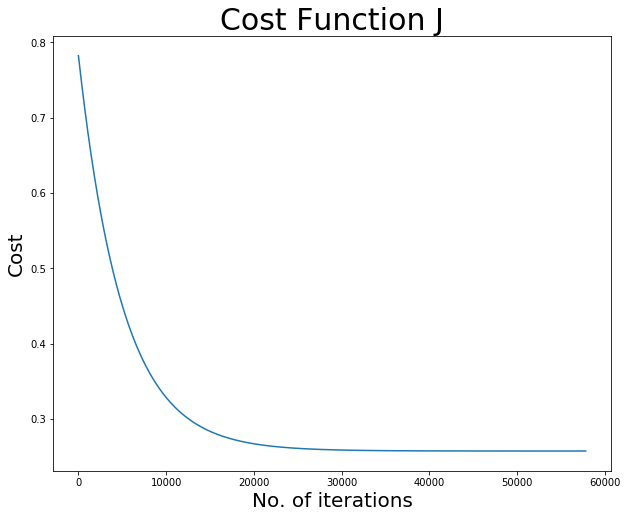

In [27]:
plt.title('Cost Function J', size = 30)
plt.xlabel('No. of iterations', size=20)
plt.ylabel('Cost', size=20)
plt.plot(cost_list)
plt.show()

# Animating Cost Function

Now we'll try to see the cost function animation <br>
i.e. how cost function value eventually change with the number of iterations and respectively how the linear 
regression line change 

Just ignore the below code, it is too much hard coded for making the animation. 

In [28]:
xl = np.linspace(0, len(cost_list),len(cost_list))
cost_list_mod = cost_list[::-1][0::100][::-1]
x_mod = xl[::-1][0::100][::-1]
prediction_list_mod = prediction_list[::-1][0::100][::-1]

In [29]:
fig = plt.figure(figsize=(12,10))
ax1=plt.subplot(121)
ax1.scatter(x[:,1], y, color='C1')
ax1.set_xlabel('Average number of rooms per dwelling')
ax1.set_ylabel('House Price')



ax2=plt.subplot(122)
ax2.set_xlim(-2,140000)
ax2.set_ylim((0, 1))
ax2.set_xlabel('Number of iterations')
ax2.set_ylabel('Cost Function')
line1, = ax1.plot([], [], lw=2);
line2, = ax2.plot([], [], lw=2);
line3, = ax2.plot([], [], 'o');


annotation1 = ax1.text(-3.5, 3, '', size=18)
annotation2 = ax2.text(16500, .957, '', size=18)
annotation1.set_animated(True)
annotation2.set_animated(True)
plt.close()

In [30]:
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return (line1, line2,)

# animation function. 
def animate(i):
    line1.set_data(x[:,1], prediction_list_mod[i])
    line2.set_data(x_mod[:i],cost_list_mod[:i])
    line3.set_data(x_mod[i],cost_list_mod[i])
    
    annotation1.set_text('J = %.2f' % (cost_list_mod[i]))
    annotation2.set_text('J = %.2f' % (cost_list_mod[i]))
    return line1, line2, line3, annotation1, annotation2

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=500,interval=15,  blit=True)

anim.save('animation.gif', writer='imagemagick', fps = 30)

# HTML(anim.to_html5_video())


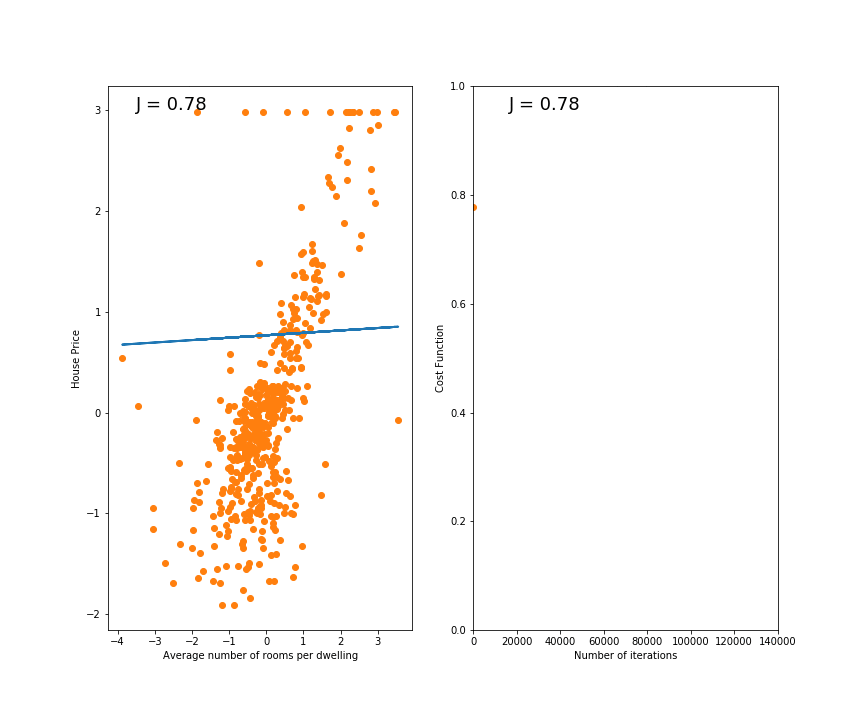

In [31]:
#Display the animation...
import io
import base64
from IPython.display import HTML

filename = 'animation.gif'

video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

In [32]:
import matplotlib.animation as animation
print(animation.writers.list())

['ffmpeg', 'ffmpeg_file', 'imagemagick', 'imagemagick_file']


Ok, from the above animation we notice that with the number of iterations increasing the cost function value is 
decreasing and the linear regression line is fitting properly to the data. 

Since, for this $\alpha$ (learning rate) this case is converging, so this is happening. <br>
For other $\alpha$ like increasing, this won't be happening. <br>
We'll try to plot the cost function for different $\alpha$ and see how alpha affects the convergence 

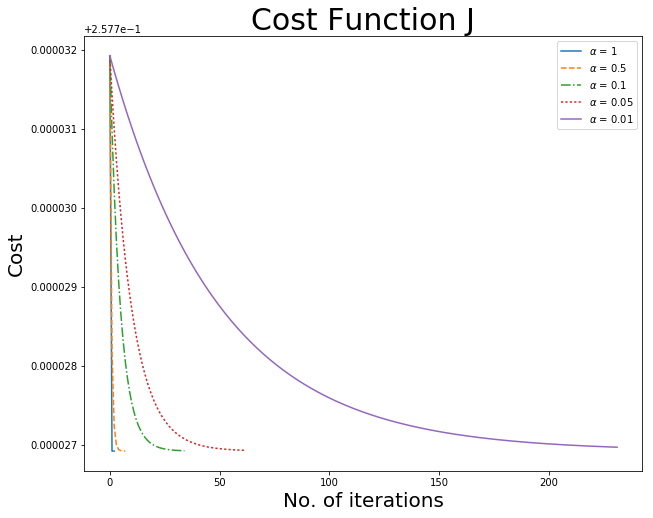

In [33]:
alpha_list = [1,0.5,0.1,0.05,0.01] 
plot_style = ["-","--","-.",":"]
from itertools import cycle
plot_styles = cycle(plot_style)
for i in range(len(alpha_list)):
    prediction_list, cost_list, theta_list = gradient_descent(x, y, m, theta, alpha_list[i])
    plt.title('Cost Function J', size = 30)
    plt.xlabel('No. of iterations', size=20)
    plt.ylabel('Cost', size=20)
    plt.plot(cost_list,next(plot_styles), label =r'$\alpha$ = {}'.format(alpha_list[i]) )
    plt.legend()
plt.show()


We can see with the increase in $\alpha$ the curve steep rate is increasing, so the convergence rate will be 
higher

Residuals are very useful in finding the fidelity of the model 


Mean square of the residuals can be find by 

Mean square of residuals = $(1/m) \times (Predicted \quad Response - Response)^2 $

Predicted value we can either find from $y_{predicted} = \theta_0 + \theta_1 \times x$

In [34]:
yp = theta[1]*x[:,1] + theta[0]

In [35]:
round(((yp - y) ** 2).mean(),4)

0.5155

Or from the gradient_descent function we found the prediction list 

In [36]:
round(((prediction_list[-1] - y)**2).mean(),4)

0.5155

### Variance

Variance is the measure of how far the data set values are
spread out. If all the house prices are equal, then variance 
of the dataset is zero

$var(x) = \dfrac{\sum_{i=1}^{n}(x_i - \bar{x})^2 }{n-1}$

In [37]:
var = sum((x[:,1] - x[:,1].mean())**2) *(1/(m-1))
round(var,3)


1.0

We can also use numpy way for calculating this

In [38]:
round(np.var(x[:,1], ddof=1),3)

1.0

### Covariance

Covariance is a measure of how much two variables change together
If the values increase together, then covariance is positive.
If one value increases and other decreases then covariance is
negative. <br>
If there is no linear relationship then covariance is zero

$cov(x,y) = \dfrac{\sum_{i=1}^{n}(x_i - \bar{x}) (y_i - \bar{y}) }{n-1}$

In [39]:
cov = sum((x[:,1] - x[:,1].mean()) * (y - y.mean()) )*(1/(m-1))
print(round(cov,3))

0.695


We can also do numpy way to do this

In [40]:
np.cov(x[:,1],y)

array([[ 1.        ,  0.69535995],
       [ 0.69535995,  1.        ]])

np.cov actually gives a covariance matrix <br>
The diagonal terms gives variance i.e. $\dfrac{\sum_{i=1}^{n}(x_i - \bar{x})^2 }{n-1}$  <br>
and off-diagonal terms gives covariance i.e. $\dfrac{\sum_{i=1}^{n}(x_i - \bar{x}) (y_i - \bar{y}) }{n-1}$

So, covariance here is

In [41]:
print(round(np.cov(x[:,1],y)[0][1],3))

0.695


$\theta_0$ and $\theta_1$ values are also related as <br>
$\bar{y} = \theta_0 + \theta_1 \times \bar{x}$

Since we know the variance and covariance of the dataset, we can calculate $\theta_1$ from them <br>
$\theta_1 = \dfrac{cov(x,y)}{var(x)}$

In [42]:
theta_1 = cov/var
theta_0 = y.mean() - theta_1 * x[:,1].mean()
print('theta_0 = {} and theta_1 = {} '.format(round(theta_0,3),round(theta_1,3)))

theta_0 = 0.0 and theta_1 = 0.695 


In [43]:
# And from gradient descent we got
print('theta_0 = {} and theta_1 = {} '.format(round(theta[0],3),round(theta[1],3)))

theta_0 = 0.002 and theta_1 = 0.693 


In [44]:
residuals = abs(y - prediction_list[-1])
var = abs(x[:,1] - x[:,1].mean())
covar = abs((x[:,1] - x[:,1].mean())*(y - y.mean()))

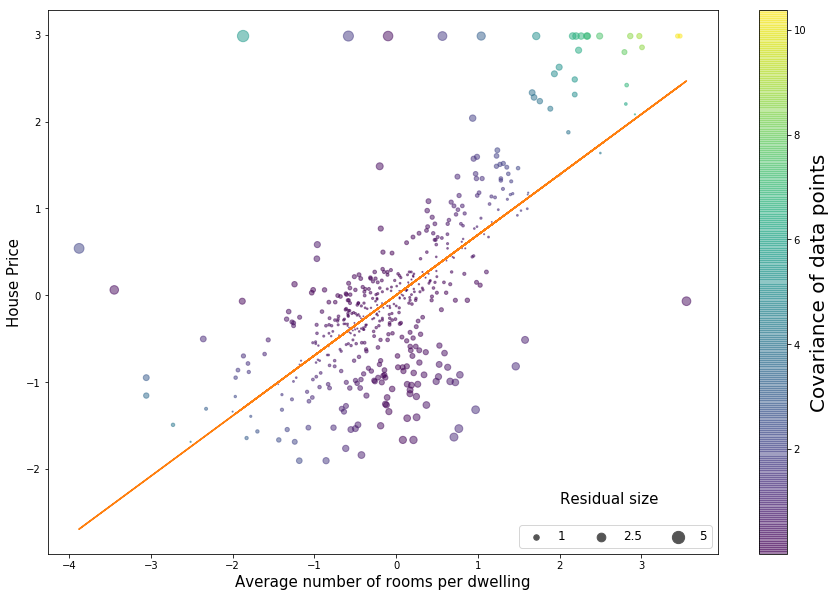

In [45]:
sc=plt.scatter(x[:,1],y, s=30*residuals, c = covar,alpha=0.5)
plt.plot(x[:,1],prediction_list[-1],color='C1')
fig = plt.gcf()
fig.set_size_inches(15, 10)

plt.xlabel('Average number of rooms per dwelling', size=15)
plt.ylabel('House Price', size=15)

s1 = plt.scatter([],[], s=1*30, marker='o', color='#555555')
s2 = plt.scatter([],[], s=2.5*30, marker='o', color='#555555')
s3 = plt.scatter([],[], s=5*30, marker='o', color='#555555')

plt.legend((s1,s2,s3),
       ('1', '2.5','5'),
       scatterpoints=1,
       loc='lower right',
       ncol=3,
       fontsize=12,
           )
cb=plt.colorbar(sc)
cb.set_label('Covariance of data points', fontsize=20)
plt.text(2, -2.4, 'Residual size',fontsize=15)
plt.show()

This is just a fancy plot same as earlier one, but showing the size of data point with respect to its residual
and color with respect to its covariance. <br>
So, larger size data points are far away from the prediction line and has large error in estimation. 

### Using sci-kit learn

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing

In [47]:
lm = LinearRegression()

In [48]:
xs = df['RM']
ys = df['Price']

In [49]:
# Feature scaling
xs = preprocessing.scale(xs)
ys = preprocessing.scale(ys)

In [50]:
xs = xs.reshape(-1,1)
ys = ys.reshape(-1,1)

In [51]:
lm.fit(xs,ys)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [52]:
pred = lm.predict(xs)

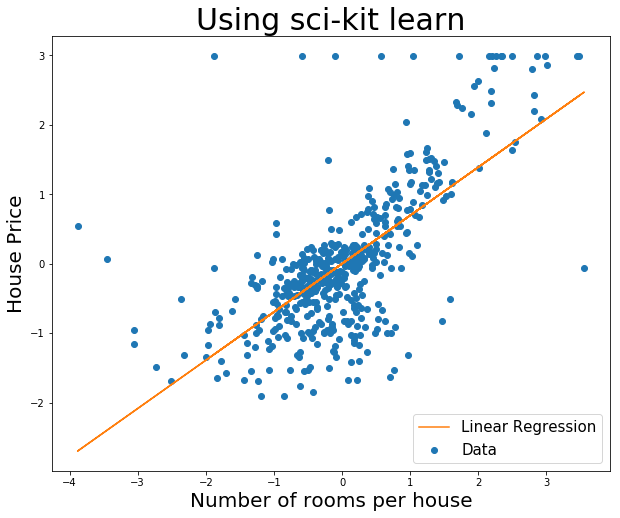

In [53]:
plt.scatter(xs,ys, label='Data')
plt.plot(xs,pred, color='C1',label='Linear Regression')
plt.xlabel('Number of rooms per house', size = 20)
plt.ylabel('House Price', size = 20)
plt.legend(prop={'size': 15})
plt.title('Using sci-kit learn', size=30)
plt.show()

In [54]:
# To get the intercept and slope of the line
print(round(lm.intercept_[0],3),',', round(lm.coef_[0][0],3))

-0.0 , 0.695


These are $\theta_0$ and $\theta_1$ we calculated using gradient descent from scratch

In [55]:
print(round(theta[0],3),round(theta[1],3))

0.002 0.693


## $R^2$

r-squared describes the proportion of variance in the response 
variable predicted by the model 

$R^2 = 1 -\dfrac{\sum_{i=1}^{n} (y_i - y_{predicted})^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}$

In [56]:
r2 = 1 - (sum((y - prediction_list[-1])**2)) / (sum((y - y.mean())**2))

In [57]:
print(round(r2,3))

0.484


From sci-kit learn we can calculate same thing as 

In [58]:
print(round(lm.score(xs,ys),3))

0.484


And mean squared error from sci-kit learn

In [59]:
from sklearn.metrics import mean_squared_error

In [60]:
mean_squared_error(ys,pred)

0.51647454400866588

Below cells are for styling, ignore them.

Below cell is for styling, ignore it

In [61]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))